<a href="https://colab.research.google.com/github/YashwanthAnantha/YashwanthAnantha/blob/main/Climate_Connect.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Name: Anantha Reddi Yaswanth
      Guvi, Chennai
**Assignment: Climate Connect- Time se

In [ ]:
#importing all the required packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import matplotlib.gridspec as gridspec
from matplotlib.ticker import MaxNLocator
import warnings
pd.options.display.max_columns = 250
pd.options.display.max_rows = 250
warnings.filterwarnings('ignore')
plt.style.use('fivethirtyeight')

In [ ]:
climate_df = pd.read_csv('/content/AssignmentData.csv')

In [ ]:
climate_df.shape

(103584, 10)

In [ ]:
climate_df.head()

,Unnamed: 0,datetime,load,apparent_temperature,temperature,humidity,dew_point,wind_speed,cloud_cover,date
0,0,2018-01-01 00:00:00,803.22270,10.45800,10.45800,0.955500,8.946000,0.0,0.0,2018-01-01
1,1,2018-01-01 00:15:00,774.89523,10.32675,10.32675,0.961625,8.911875,0.0,0.0,2018-01-01
2,2,2018-01-01 00:30:00,731.46927,10.19550,10.19550,0.967750,8.877750,0.0,0.0,2018-01-01
3,3,2018-01-01 00:45:00,713.93870,10.06425,10.06425,0.973875,8.843625,0.0,0.0,2018-01-01
4,4,2018-01-01 01:00:00,699.23007,9.93300,9.93300,0.980000,8.809500,0.0,0.0,2018-01-01


In [ ]:
climate_df.describe()

,Unnamed: 0,load,apparent_temperature,temperature,humidity,dew_point,wind_speed,cloud_cover
count,103584.000000,101952.000000,103584.000000,103584.000000,103584.000000,103584.000000,103584.000000,103584.000000
mean,51791.500000,1558.964330,29.084052,27.080153,0.602338,15.890729,2.431892,0.329437
std,29902.269479,531.116557,10.411410,8.496460,0.235395,7.938254,1.365737,0.334519
min,0.000000,480.631730,2.173500,3.685500,0.042000,-13.692000,0.000000,0.000000
25%,25895.750000,1184.992600,20.590500,20.559000,0.420000,9.783375,1.477875,0.000000
50%,51791.500000,1496.820000,29.922375,28.621688,0.609000,14.899500,2.352000,0.215250
75%,77687.250000,1935.745800,37.458750,33.348000,0.798000,23.887500,3.286500,0.582750
max,103583.000000,3230.848600,56.731500,47.943000,1.050000,31.059000,10.321500,1.050000


In [ ]:
#droping un necessary columns
climate_df.drop(columns = ['Unnamed: 0'], axis=1, inplace=True)

In [ ]:
climate_df.head()

,datetime,load,apparent_temperature,temperature,humidity,dew_point,wind_speed,cloud_cover,date
0,2018-01-01 00:00:00,803.22270,10.45800,10.45800,0.955500,8.946000,0.0,0.0,2018-01-01
1,2018-01-01 00:15:00,774.89523,10.32675,10.32675,0.961625,8.911875,0.0,0.0,2018-01-01
2,2018-01-01 00:30:00,731.46927,10.19550,10.19550,0.967750,8.877750,0.0,0.0,2018-01-01
3,2018-01-01 00:45:00,713.93870,10.06425,10.06425,0.973875,8.843625,0.0,0.0,2018-01-01
4,2018-01-01 01:00:00,699.23007,9.93300,9.93300,0.980000,8.809500,0.0,0.0,2018-01-01


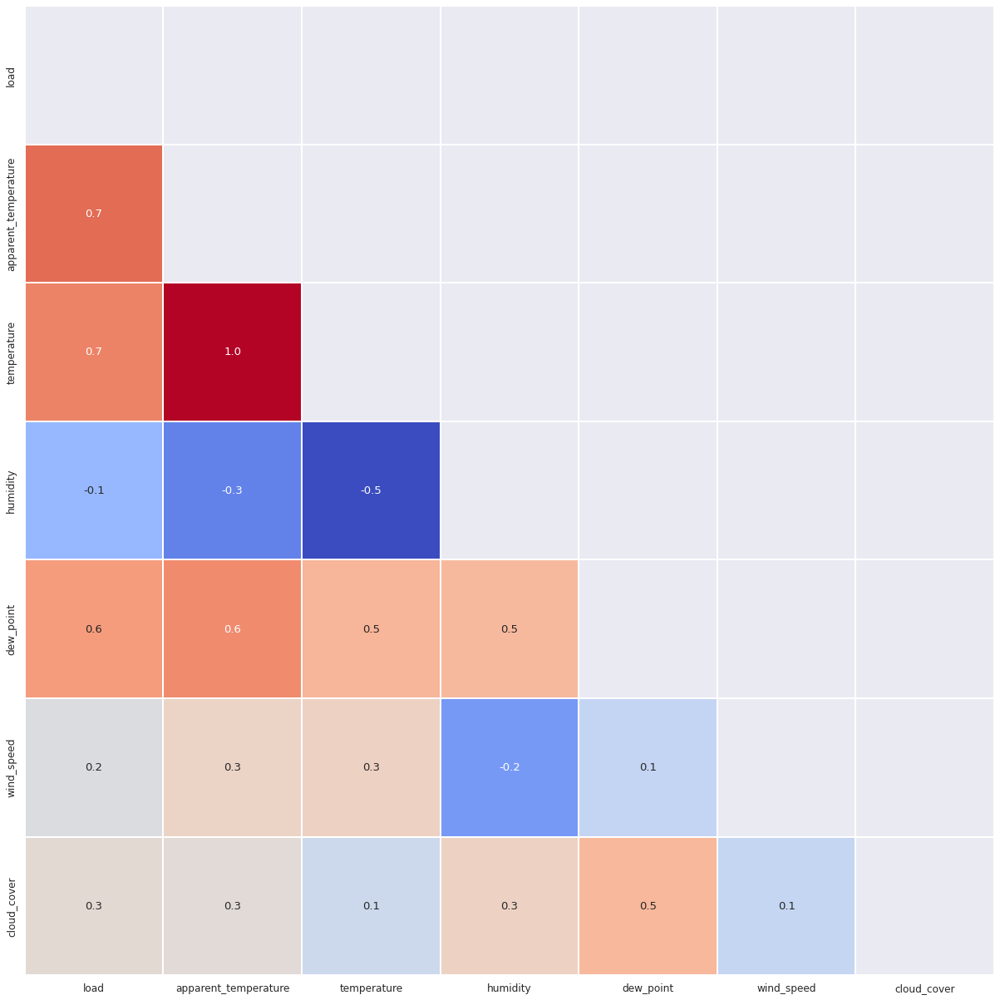

In [ ]:
# Display numerical correlations (pearson) between features on heatmap.

sns.set(font_scale=1.1)
correlation_train = climate_df.corr()
mask = np.triu(correlation_train.corr())
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_train,
            annot=True,
            fmt='.1f',
            cmap='coolwarm',
            square=True,
            mask=mask,
            linewidths=1,
            cbar=False)

plt.show()

In [ ]:
climate_df.isnull()

,datetime,load,apparent_temperature,temperature,humidity,dew_point,wind_speed,cloud_cover,date
0,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...
103579,False,True,False,False,False,False,False,False,False
103580,False,True,False,False,False,False,False,False,False
103581,False,True,False,False,False,False,False,False,False
103582,False,True,False,False,False,False,False,False,False


In [ ]:
#replace -9999.000000 with nan (invalid entries) no need
climate_df = climate_df.replace(-9999.000000, np.nan)

In [ ]:
def missing_percentage(df):
    
    """A function for returning missing ratios."""
    
    total = df.isnull().sum().sort_values(
        ascending=False)[df.isnull().sum().sort_values(ascending=False) != 0]
    percent = (df.isnull().sum().sort_values(ascending=False) / len(df) *
               100)[(df.isnull().sum().sort_values(ascending=False) / len(df) *
                     100) != 0]
    return pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])

,load
Total,1632.000000
Percent,1.575533


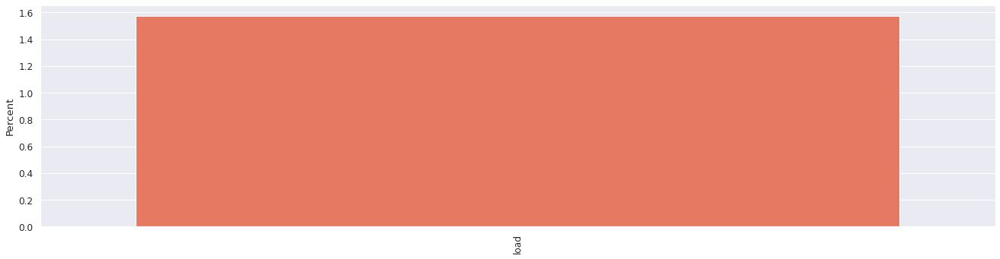

In [ ]:
# no need
#missing = missing_percentage(climate_df)

fig, ax = plt.subplots(figsize=(20, 5))
sns.barplot(x=missing.index, y='Percent', data=missing, palette='Reds_r')
plt.xticks(rotation=90)

display(missing.T.style.background_gradient(cmap='Reds', axis=1))

In [ ]:
freq_cols = ['wind_speed', 'cloud_cover']

for col in freq_cols:
    climate_df[col].replace(np.nan, climate_df[col].mode()[0], inplace=True)

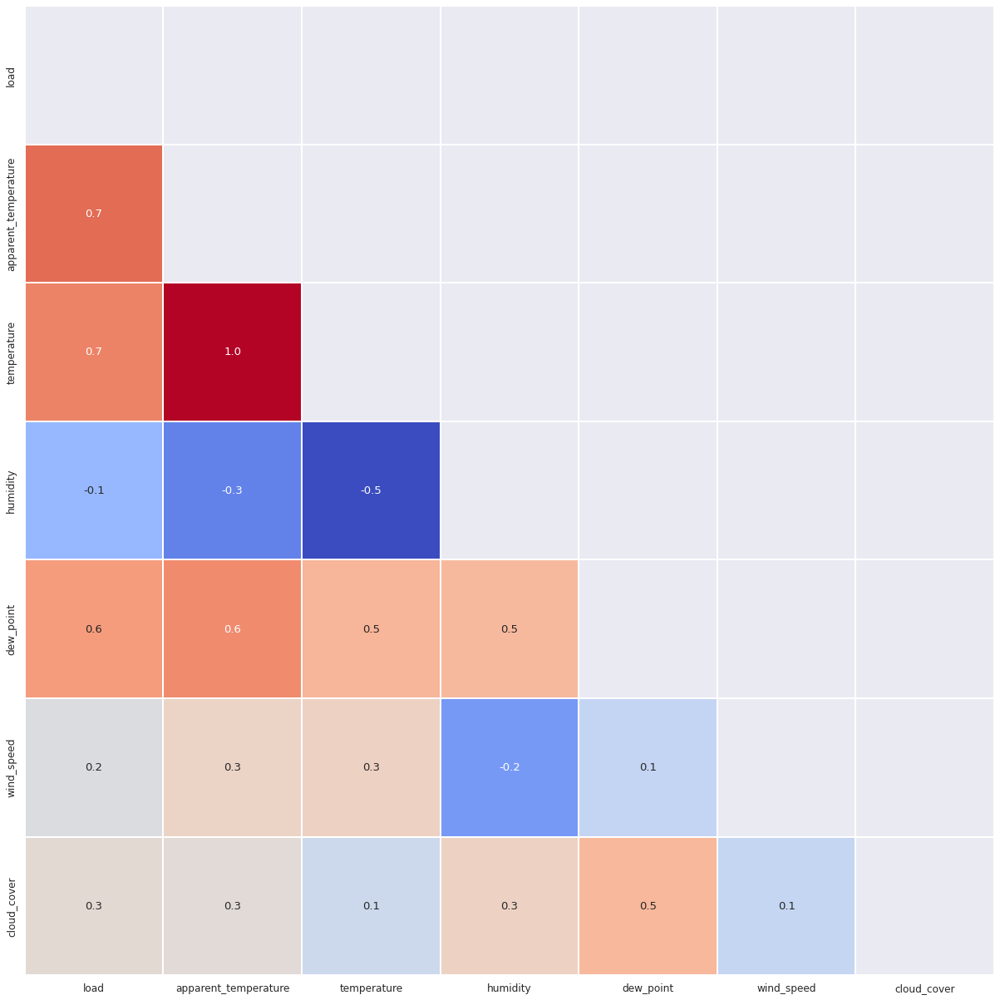

In [ ]:
sns.set(font_scale=1.1)
correlation_train = climate_df.corr()
mask = np.triu(correlation_train.corr())
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_train,
            annot=True,
            fmt='.1f',
            cmap='coolwarm',
            square=True,
            mask=mask,
            linewidths=1,
            cbar=False)

plt.show()

In [ ]:
#As we have previously deduced we can see that temperature and apparent_temperature are perfectly correlated 
#hence we can drop one of these values and still maintain all the relevant information
column_to_drop = ['apparent_temperature']
climate_df.drop(columns = column_to_drop, axis=1, inplace=True)


In [ ]:
## setting datetime_local as index for upsampling
climate_df['datetime'] = pd.to_datetime(climate_df['datetime'])
climate_df['datetime'] = climate_df['datetime'].copy()
climate_df.set_index('datetime', inplace=True)
climate_df.head()

KeyError: ignored

In [ ]:
climate_df = climate_df.resample('15Min').mean()
climate_df_columns = climate_df.columns
for column in climate_df_columns:
    climate_df[column] = climate_df[column].interpolate()
    
climate_df.head()

,load,temperature,humidity,dew_point,wind_speed,cloud_cover
datetime,,,,,,
2018-01-01 00:00:00,803.22270,10.45800,0.955500,8.946000,0.0,0.0
2018-01-01 00:15:00,774.89523,10.32675,0.961625,8.911875,0.0,0.0
2018-01-01 00:30:00,731.46927,10.19550,0.967750,8.877750,0.0,0.0
2018-01-01 00:45:00,713.93870,10.06425,0.973875,8.843625,0.0,0.0
2018-01-01 01:00:00,699.23007,9.93300,0.980000,8.809500,0.0,0.0


In [ ]:
nRow, nCol = climate_df.shape
print(f'There are {nRow} rows and {nCol} columns after interpolation')

There are 103584 rows and 6 columns after interpolation


In [ ]:
climate_df.head()

,load,temperature,humidity,dew_point,wind_speed,cloud_cover
datetime,,,,,,
2018-01-01 00:00:00,803.22270,10.45800,0.955500,8.946000,0.0,0.0
2018-01-01 00:15:00,774.89523,10.32675,0.961625,8.911875,0.0,0.0
2018-01-01 00:30:00,731.46927,10.19550,0.967750,8.877750,0.0,0.0
2018-01-01 00:45:00,713.93870,10.06425,0.973875,8.843625,0.0,0.0
2018-01-01 01:00:00,699.23007,9.93300,0.980000,8.809500,0.0,0.0


In [ ]:
# Plotting numerical features with polynomial order to detect outliers by eye.

def srt_reg(y, climate_df , subplot_y, subplot_x):
    fig, axes = plt.subplots(subplot_y, subplot_x, figsize=(40, 80))
    axes = axes.flatten()

    for i, j in zip(climate_df.select_dtypes(include=['number']).columns, axes):

        sns.regplot(x=i,
                    y=y,
                    data=climate_df,
                    ax=j,
                    order=3,
                    ci=None,
                    color='#e74c3c',
                    line_kws={'color': 'black'},
                    scatter_kws={'alpha':0.4})
        j.tick_params(labelrotation=45)
        j.yaxis.set_major_locator(MaxNLocator(nbins=10))

        plt.tight_layout()

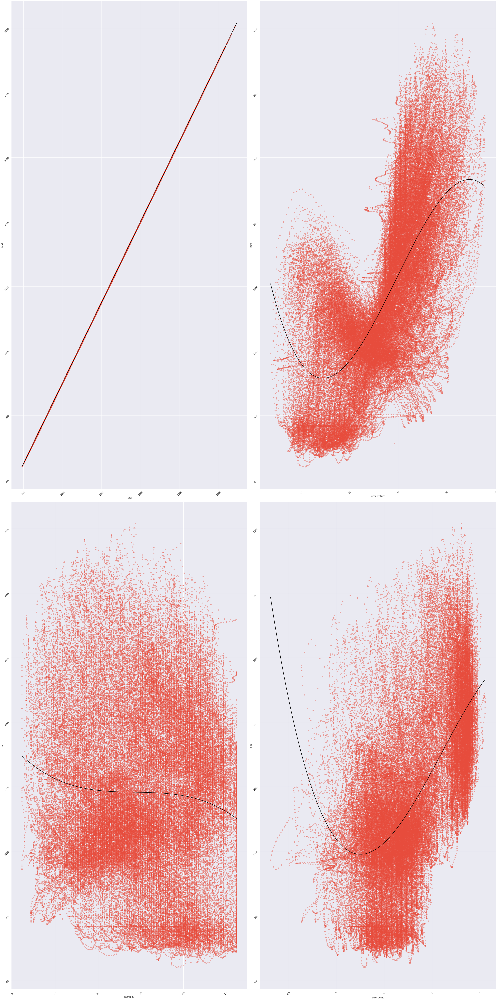

In [ ]:
srt_reg('load', climate_df,2,2)

In [ ]:
climate_df['datetime_hour'] = pd.DatetimeIndex(climate_df.index).hour
climate_df.sample(5)

,load,temperature,humidity,dew_point,wind_speed,cloud_cover,datetime_hour
datetime,,,,,,,
2020-11-09 02:15:00,616.1000,18.010125,0.538125,7.342125,0.926625,0.00000,2
2018-03-27 16:30:00,1477.4583,39.375000,0.136500,4.446750,4.693500,0.00000,16
2019-04-15 00:30:00,1715.0810,33.400500,0.304500,12.222000,3.864000,0.00525,0
2019-10-11 19:00:00,1700.5976,30.828000,0.525000,18.669000,1.543500,0.32550,19
2020-04-29 23:45:00,1481.4276,31.237500,0.525000,16.096500,1.837500,0.24150,23


In [ ]:
climate_df['hour_cos'] = np.cos(2 * np.pi * climate_df['datetime_hour']/max(climate_df['datetime_hour']))

In [ ]:
climate_df.head()

,load,temperature,humidity,dew_point,wind_speed,cloud_cover,datetime_hour,hour_cos
datetime,,,,,,,,
2018-01-01 00:00:00,803.22270,10.45800,0.955500,8.946000,0.0,0.0,0,1.000000
2018-01-01 00:15:00,774.89523,10.32675,0.961625,8.911875,0.0,0.0,0,1.000000
2018-01-01 00:30:00,731.46927,10.19550,0.967750,8.877750,0.0,0.0,0,1.000000
2018-01-01 00:45:00,713.93870,10.06425,0.973875,8.843625,0.0,0.0,0,1.000000
2018-01-01 01:00:00,699.23007,9.93300,0.980000,8.809500,0.0,0.0,1,0.962917


In [ ]:
# daypart function 
def daypart(hour):
    if 0<= hour <= 5:
        return "Night"
    elif 5 < hour < 19:
        return "Day"
    elif 19 <= hour <=23:
        return "Night"
    else: return "Night"
#day and night onehot encoding
climate_df['day_part'] = climate_df['datetime_hour'].apply(daypart)

# mapping day as 1 and night as 0
day_part_map = {"Day" : 1, "Night": 0}
climate_df['day_part'] = climate_df['day_part'].map(day_part_map).astype('int')

In [ ]:
#importing scipy packages
from scipy import stats
from scipy.stats import skew, boxcox_normmax, norm
from scipy.special import boxcox1p

skewed = ['cloud_cover', 'temperature', 'humidity', 'dew_point', 'wind_speed', 'load']
# Finding skewness of the numerical features.

skew_features = np.abs(climate_df[skewed].apply(lambda x: skew(x)).sort_values(ascending=False))

# Filtering skewed features.

high_skew = skew_features[skew_features > 0.3]

# Taking indexes of high skew.

skew_index = high_skew.index

# Applying boxcox transformation to fix skewness.

for i in skew_index:
    climate_df[i] = boxcox1p(climate_df[i], boxcox_normmax(climate_df[i] + 1))

In [ ]:
#should be greater than zero
print(f'Number of missing values: {climate_df.isna().sum().sum()}') 

Number of missing values: 0


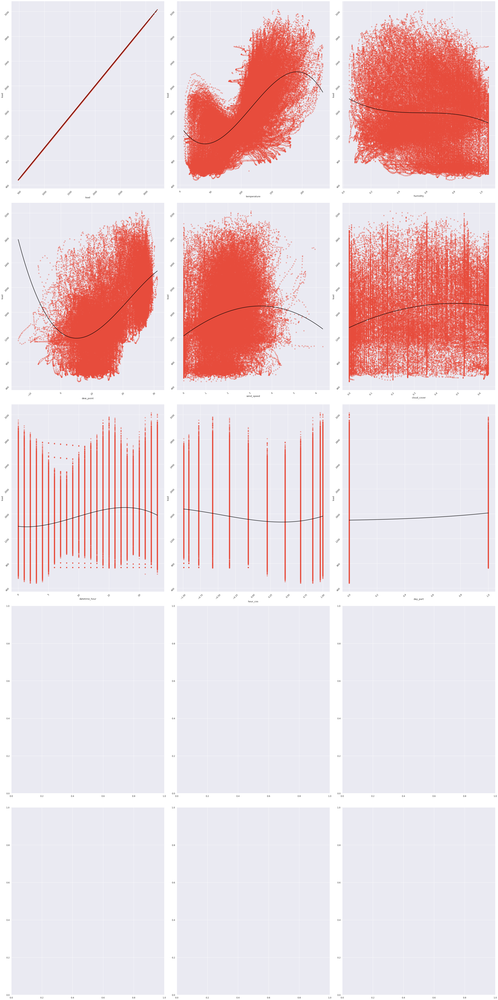

In [ ]:
srt_reg('load', climate_df,5,3 )

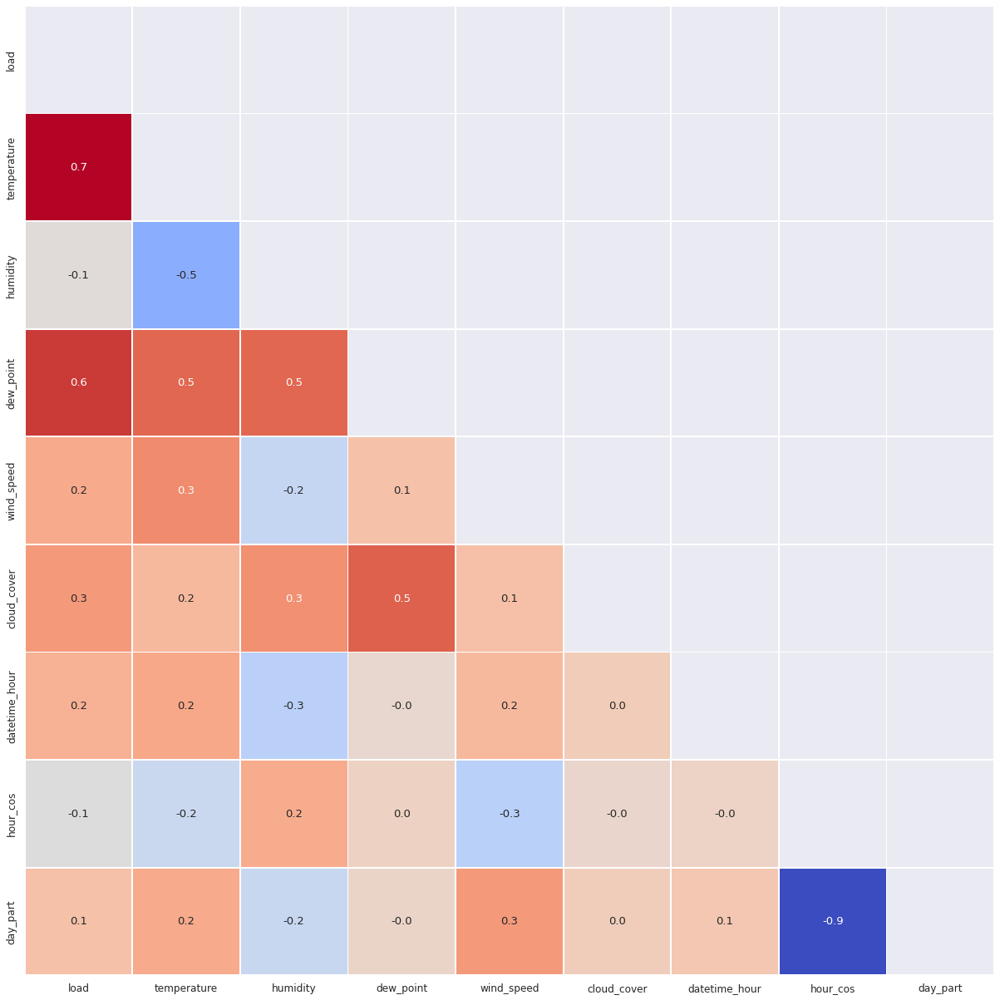

In [ ]:
#again correlating for better understanding
# Display numerical correlations (pearson) between features on heatmap.

sns.set(font_scale=1.1)
correlation_train = climate_df.corr()
mask = np.triu(correlation_train.corr())
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_train,
            annot=True,
            fmt='.1f',
            cmap='coolwarm',
            square=True,
            mask=mask,
            linewidths=1,
            cbar=False)

plt.show()

In [ ]:
# # Features to drop:

to_drop = ['datetime_hour','humidity', 'dew_point', 'cloud_cover']

# Dropping features.

climate_df.drop(columns=to_drop, inplace=True)

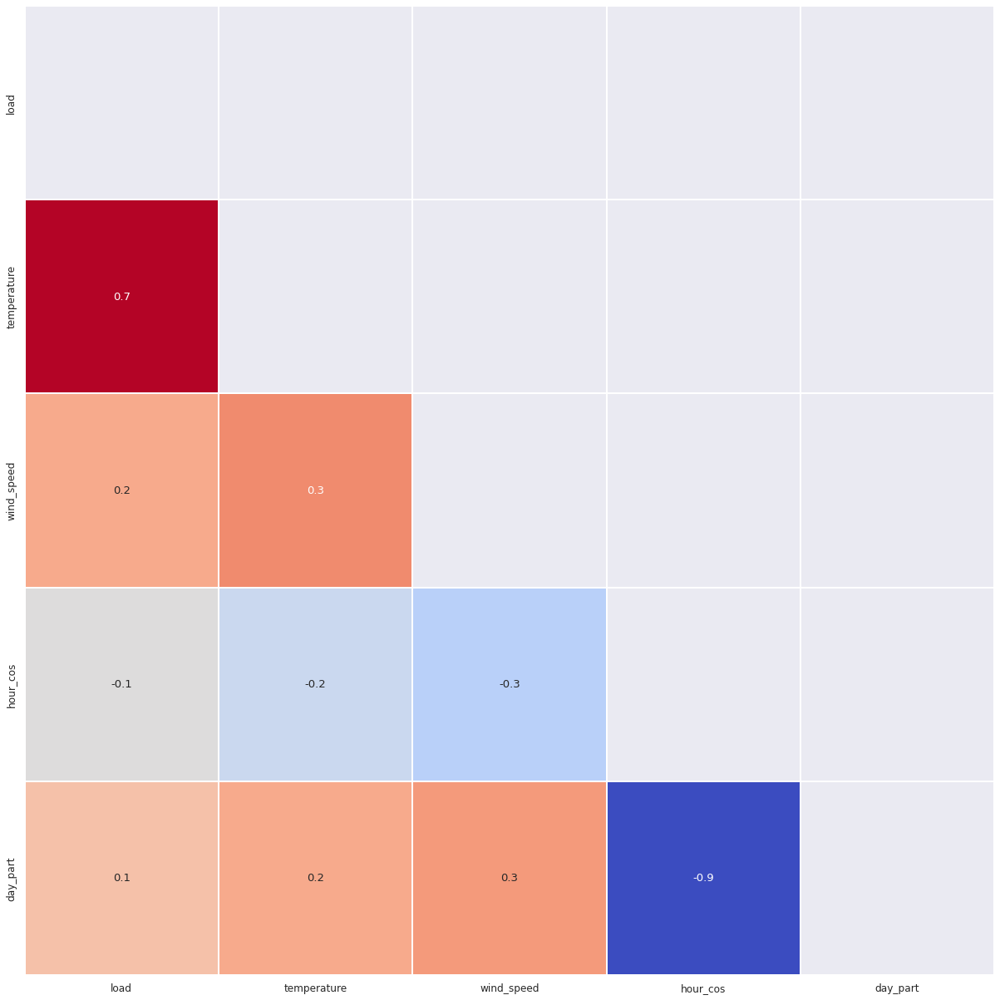

In [ ]:
# Display numerical correlations (pearson) between features on heatmap.
# After dropping correlation
sns.set(font_scale=1.1)
correlation_train = climate_df.corr()
mask = np.triu(correlation_train.corr())
plt.figure(figsize=(20, 20))
sns.heatmap(correlation_train,
            annot=True,
            fmt='.1f',
            cmap='coolwarm',
            square=True,
            mask=mask,
            linewidths=1,
            cbar=False)

plt.show()

In [ ]:
def plot_dist3(climate_df, feature, title):
    
    # Creating a customized chart. and giving in figsize and everything.
    
    fig = plt.figure(constrained_layout=True, figsize=(12, 8))
    
    # creating a grid of 3 cols and 3 rows.
    
    grid = gridspec.GridSpec(ncols=3, nrows=3, figure=fig)

    # Customizing the histogram grid.
    
    ax1 = fig.add_subplot(grid[0, :2])
    
    # Set the title.
    
    ax1.set_title('Histogram')
    
    # plot the histogram.
    
    sns.distplot(climate_df.loc[:, feature],
                 hist=True,
                 kde=True,
                 fit=norm,
                 ax=ax1,
                 color='#e74c3c')
    ax1.legend(labels=['Normal', 'Actual'])

    # customizing the QQ_plot.
    
    ax2 = fig.add_subplot(grid[1, :2])
    
    # Set the title.
    
    ax2.set_title('Probability Plot')
    
    # Plotting the QQ_Plot.
    stats.probplot(climate_df.loc[:, feature].fillna(np.mean(climate_df.loc[:, feature])),
                   plot=ax2)
    ax2.get_lines()[0].set_markerfacecolor('#e74c3c')
    ax2.get_lines()[0].set_markersize(12.0)

    # Customizing the Box Plot:
    
    ax3 = fig.add_subplot(grid[:, 2])
    # Set title.
    
    ax3.set_title('Box Plot')
    
    # Plotting the box plot.
    
    sns.boxplot(climate_df.loc[:, feature], orient='v', ax=ax3, color='#e74c3c')
    ax3.yaxis.set_major_locator(MaxNLocator(nbins=24))

    plt.suptitle(f'{title}', fontsize=24)

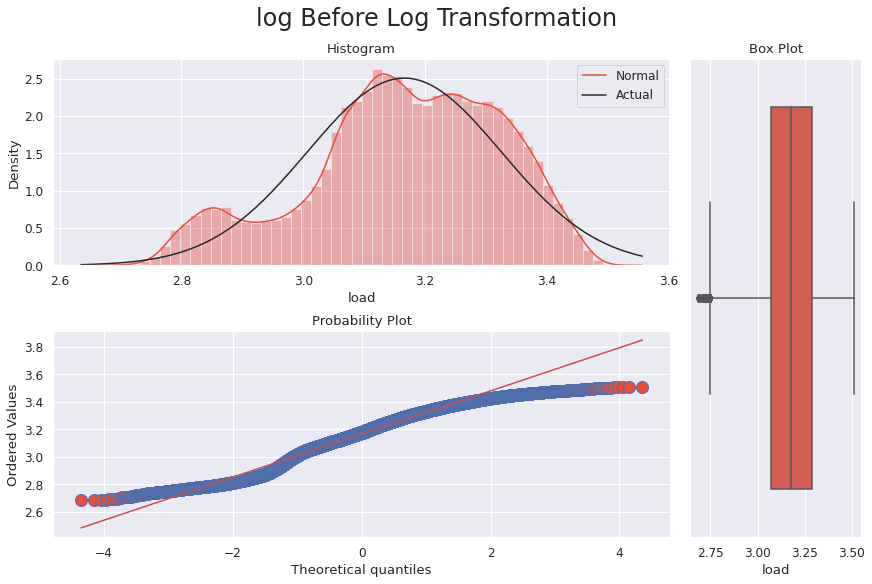

In [ ]:
plot_dist3(climate_df, 'load', 'log Before Log Transformation')

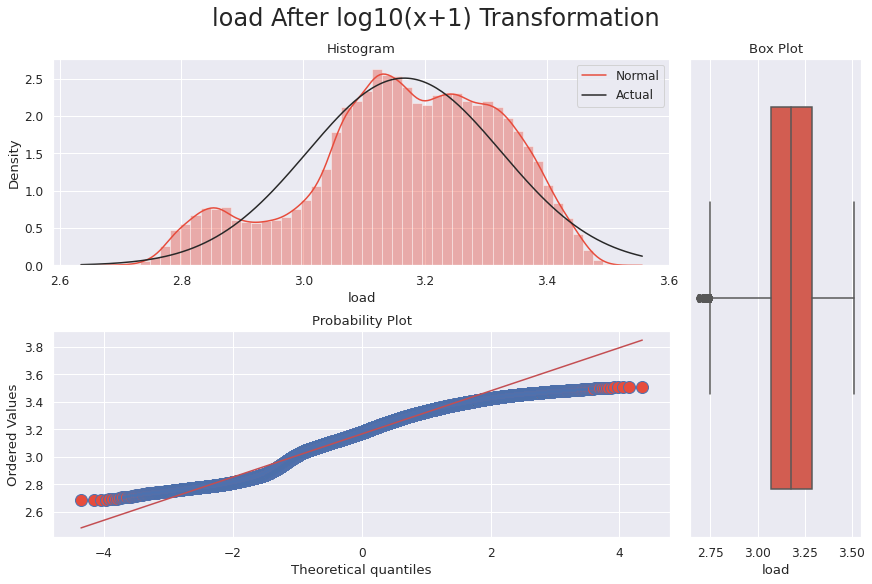

In [ ]:
climate_df['load'] = np.log10(climate_df['load']+1)
plot_dist3(climate_df, 'load', 'load After log10(x+1) Transformation')

In [ ]:
# Back up target variables and dropping them from train data.

y = climate_df['load'].reset_index(drop=True)
climate_df = climate_df.drop(['load'], axis=1)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(climate_df, y, test_size=0.5, random_state=42)

In [ ]:
# Loading neccesary packages for modelling.
from sklearn.model_selection import cross_val_score,KFold, cross_validate
from sklearn.preprocessing import RobustScaler
from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_squared_error
from xgboost import XGBRegressor

In [ ]:
# Setting kfold for future use
kf=KFold(4, random_state=None)
# xgboost:
xgboost = XGBRegressor(
    learning_rate=0.0139,
    n_estimators=4500,
    max_depth=4,
    min_child_weight=0,
    subsample=0.7968,
    colsample_bytree=0.4064,
    nthread=-1,
    scale_pos_weight=2,
    seed=42,
)

In [ ]:
def model_check(X, y, estimators, cv):
    
    ''' A function for testing multiple estimators.'''
    
    model_table = pd.DataFrame()

    row_index = 0
    for est, label in zip(estimators, labels):

        MLA_name = label
        model_table.loc[row_index, 'Model Name'] = MLA_name

        cv_results = cross_validate(est,
                                    X,
                                    y,
                                    cv=cv,
                                    scoring='neg_root_mean_squared_error',
                                    return_train_score=True,
                                    n_jobs=-1)

        model_table.loc[row_index, 'Train RMSE'] = -cv_results[
            'train_score'].mean()
        model_table.loc[row_index, 'Test RMSE'] = -cv_results[
            'test_score'].mean()
        model_table.loc[row_index, 'Test Std'] = cv_results['test_score'].std()
        model_table.loc[row_index, 'Time'] = cv_results['fit_time'].mean()

        row_index += 1

    model_table.sort_values(by=['Test RMSE'],
                            ascending=True,
                            inplace=True)

    return model_table

In [ ]:
estimators = [xgboost]
labels = ['XGBRegressor']

In [ ]:
# # # # Executing cross validation.
raw_models = model_check(X_train, y_train, estimators, kf)

In [ ]:
display(raw_models.style.background_gradient(cmap='summer_r'))

,Model Name,Train RMSE,Test RMSE,Test Std,Time
0,XGBRegressor,0.108572,0.111705,0.000503,82.238284


**Here we are using 4 fold valdation technique with train data and we are getting root mean square train_error of about 0.09 and root mean square test_error of about 0.1.**

In [ ]:
estimators = [xgboost]
for est in estimators:
    est.fit(X_train, y_train)

    y_pred = est.predict(X_test)

    mse=mean_squared_error(y_test, y_pred)

    print(np.sqrt(mse), str(est))

[12:20:09] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
0.1119697701120842 XGBRegressor(colsample_bytree=0.4064, learning_rate=0.0139, max_depth=4,
             min_child_weight=0, n_estimators=4500, nthread=-1,
             scale_pos_weight=2, seed=42, subsample=0.7968)


**Here we are getting root mean sqaured error of 0.10 for never seen samples using xgboost.
Now lets train our model on entire data set and predict power generation for given weather forecast**

In [ ]:
climate_df.head()

,temperature,wind_speed,hour_cos,day_part
datetime,,,,
2018-01-01 00:00:00,25.575278,0.0,1.000000,0
2018-01-01 00:15:00,25.123283,0.0,1.000000,0
2018-01-01 00:30:00,24.673942,0.0,1.000000,0
2018-01-01 00:45:00,24.227270,0.0,1.000000,0
2018-01-01 01:00:00,23.783284,0.0,0.962917,0


In [ ]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [ ]:
# Fitting the models on full data.

print('=' * 20, 'START Fitting', '=' * 20)
print('=' * 55)
print(datetime.now(), 'XGboost')
xgb_model_full_data = xgboost.fit(climate_df.values, y.values)
print('=' * 20, 'FINISHED Fitting', '=' * 20)
print('=' * 58)

==================== START Fitting ====================
2022-02-24 12:22:25.967426 XGboost
[12:22:25] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
==================== FINISHED Fitting ====================


In [ ]:
climate_forecast_df = pd.read_csv('/AssignmentData.csv')
climate_forecast_df.head()

,Unnamed: 0,datetime,load,apparent_temperature,temperature,humidity,dew_point,wind_speed,cloud_cover,date
0,0,2018-01-01 00:00:00,803.22270,10.45800,10.45800,0.955500,8.946000,0.0,0.0,2018-01-01
1,1,2018-01-01 00:15:00,774.89523,10.32675,10.32675,0.961625,8.911875,0.0,0.0,2018-01-01
2,2,2018-01-01 00:30:00,731.46927,10.19550,10.19550,0.967750,8.877750,0.0,0.0,2018-01-01
3,3,2018-01-01 00:45:00,713.93870,10.06425,10.06425,0.973875,8.843625,0.0,0.0,2018-01-01
4,4,2018-01-01 01:00:00,699.23007,9.93300,9.93300,0.980000,8.809500,0.0,0.0,2018-01-01


In [ ]:
def preprocess (df_preprocess):
    '''
    preprocess forecast df for power prediction
    '''
    #List of columns to drop
    column_to_drop = ['Unnamed: 0','cloud_cover','apparent_temperature', 'humidity', 'dew_point']
    df_preprocess.drop(columns = column_to_drop, axis=1, inplace=True) # zero std
    #replace -9999.000000 with nan (invalid entries)
    df_preprocess = df_preprocess.replace(-9999.000000, np.nan)
    # List of 'NaN' including columns where NaN's actually missing gonna replaced with mode.

    freq_cols = [ 'wind_speed']

    for col in freq_cols:
        df_preprocess[col].replace(np.nan, df_preprocess[col].mode()[0], inplace=True)
        
    ## setting datetime_local as index for upsampling
    df_preprocess['datetime'] = pd.to_datetime(df_preprocess['datetime'])
    df_preprocess['datetime'] = df_preprocess['datetime'].copy()
    df_preprocess.set_index('datetime', inplace=True)
    # upsampling
    df_preprocess = df_preprocess.resample('15Min').mean()
    weather_df_columns = df_preprocess.columns
    for column in weather_df_columns:
        df_preprocess[column] = df_preprocess[column].interpolate()
    
    # hour from datetime    
    df_preprocess['datetime_hour'] = pd.DatetimeIndex(df_preprocess.index).hour

    # cyclic features of hour
    df_preprocess['hour_cos'] = np.cos(2 * np.pi * df_preprocess['datetime_hour']/max(df_preprocess['datetime_hour']))

    #day and night extraction
    df_preprocess['day_part'] = df_preprocess['datetime_hour'].apply(daypart)

    # mapping day as 1 and night as 0
    day_part_map = {"Day" : 1, "Night": 0}
    df_preprocess['day_part'] = df_preprocess['day_part'].map(day_part_map).astype('int')


    # skewed fixes
    skewed = ['temperature', 'wind_speed', ]

    # Finding skewness of the numerical features.

    skew_features = np.abs(df_preprocess[skewed].apply(lambda x: skew(x)).sort_values(
        ascending=False))

    # Filtering skewed features.

    high_skew = skew_features[skew_features > 0.3]

    # Taking indexes of high skew.

    skew_index = high_skew.index

    # Applying boxcox transformation to fix skewness.

    for i in skew_index:
        df_preprocess[i] = boxcox1p(df_preprocess[i], boxcox_normmax(df_preprocess[i] + 1))

    # # Features to drop:
    to_drop = ['datetime_hour']

    # Dropping features.
    df_preprocess.drop(columns=to_drop, inplace=True)
    

    
    return df_preprocess

In [ ]:
df_forecast = preprocess(climate_forecast_df) # preprocess
df_forecast.head()

,load,temperature,wind_speed,hour_cos,day_part
datetime,,,,,
2018-01-01 00:00:00,803.22270,25.463604,0.0,1.000000,0
2018-01-01 00:15:00,774.89523,25.014219,0.0,1.000000,0
2018-01-01 00:30:00,731.46927,24.567460,0.0,1.000000,0
2018-01-01 00:45:00,713.93870,24.123343,0.0,1.000000,0
2018-01-01 01:00:00,699.23007,23.681883,0.0,0.962917,0


In [ ]:
df_forecast = df_forecast.reset_index()

In [ ]:
df_forecast.head()

,datetime,load,temperature,wind_speed,hour_cos,day_part
0,2018-01-01 00:00:00,803.22270,25.463604,0.0,1.000000,0
1,2018-01-01 00:15:00,774.89523,25.014219,0.0,1.000000,0
2,2018-01-01 00:30:00,731.46927,24.567460,0.0,1.000000,0
3,2018-01-01 00:45:00,713.93870,24.123343,0.0,1.000000,0
4,2018-01-01 01:00:00,699.23007,23.681883,0.0,0.962917,0


In [ ]:
df_forecast_clean = df_forecast[['temperature','wind_speed','hour_cos','day_part']]

In [ ]:
df_forecast_clean.head()

,temperature,wind_speed,hour_cos,day_part
0,25.463604,0.0,1.000000,0
1,25.014219,0.0,1.000000,0
2,24.567460,0.0,1.000000,0
3,24.123343,0.0,1.000000,0
4,23.681883,0.0,0.962917,0


In [ ]:
def xgboost_predict(X):
    return xgb_model_full_data.predict(X)

In [ ]:
# Inversing log10(x+1) scaled sale price predictions and additional feature day_part is multiplied
df_forecast['load'] = 10**(xgboost_predict(df_forecast_clean.values))*(df_forecast_clean['day_part'])
# Defining outlier quartile ranges
q1 = df_forecast['load'].quantile(0.0050)
q2 = df_forecast['load'].quantile(0.99)

# Applying weights to outlier ranges to smooth them
df_forecast['load'] = df_forecast['load'].apply(lambda x: x if x > q1 else x * 0.77)
df_forecast['load'] = df_forecast['load'].apply(lambda x: x if x < q2 else x * 1.1)

In [ ]:
submission = df_forecast[['datetime','load']]
submission.to_csv('power_prediction.csv', index=False)
print('Save submission', datetime.now(),)
submission.head()

Save submission 2022-02-24 12:36:35.739473


,datetime,load
0,2018-01-01 00:00:00,0.0
1,2018-01-01 00:15:00,0.0
2,2018-01-01 00:30:00,0.0
3,2018-01-01 00:45:00,0.0
4,2018-01-01 01:00:00,0.0
